In [7]:
import os
from collections import Counter
from heapq import heappush, heappop
from math import log
import io
import re
from pprint import pprint

# DS
import numpy as np
from scipy import spatial
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples

# visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
sns.set_style("whitegrid")
sns.set(rc={'figure.figsize':(10,8)})
import plotly.express as px
px.set_mapbox_access_token(os.getenv('MAPBOX_TOKEN'))

from langdetect import detect, detect_langs
import spacy
from spacy import displacy
from gensim.models import CoherenceModel
from gensim import corpora
from gensim.models.ldamodel import LdaModel
import pyLDAvis
import pyLDAvis.gensim
pyLDAvis.enable_notebook()

# Allow multiple outputs for each cell
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

# Suppress warnings 
import warnings
warnings.filterwarnings('ignore')

# suppress auto-conversion to scientific notation
pd.set_option('display.float_format', lambda x: '%.2f' % x)

# display all columns
pd.set_option('display.max_columns', None)

# display 100 rows
pd.set_option('display.max_rows', 20)

In [8]:
random_state = 10

# Data Cleaning

**Airbnb Sydney Data**:  https://www.kaggle.com/tylerx/sydney-airbnb-open-data

In [3]:
listings = pd.read_csv('data/sydney-airbnb-open-data/listings_dec18.csv')
listings.shape
listings.head()

(36662, 96)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,12351,https://www.airbnb.com/rooms/12351,20181207034750,2018-12-07,Sydney City & Harbour at the door,Come stay with Vinh & Stuart (Awarded as one o...,"We're pretty relaxed hosts, and we fully appre...",Come stay with Vinh & Stuart (Awarded as one o...,none,"Pyrmont is an inner-city village of Sydney, on...",We've a few reasons for the 6.00pm arrival tim...,Our home is centrally located and an easy walk...,We look forward to welcoming you just as we wo...,As much or as little as you like. We live here...,We look forward to welcoming you to stay you j...,nan,nan,https://a0.muscache.com/im/pictures/763ad5c8-c...,nan,17061,https://www.airbnb.com/users/show/17061,Stuart,2009-05-14,"Sydney, New South Wales, Australia","G'Day from Australia!\r\n\r\nHe's Vinh, and I'...",within a few hours,100%,nan,f,https://a0.muscache.com/im/users/17061/profile...,https://a0.muscache.com/im/users/17061/profile...,Pyrmont,2.00,2.00,"['email', 'phone', 'manual_online', 'reviews',...",t,t,"Pyrmont, NSW, Australia",Pyrmont,Sydney,nan,Pyrmont,NSW,2009,Sydney,"Pyrmont, Australia",AU,Australia,-33.87,151.19,t,Townhouse,Private room,2,1.00,1.00,1.00,Real Bed,"{TV,Internet,Wifi,""Air conditioning"",""Paid par...",nan,$100.00,$800.00,NaN,$0.00,$55.00,2,$395.00,2,7,today,t,6,16,28,187,2018-12-07,493,2010-07-24,2018-11-21,95.00,10.00,9.00,10.00,10.00,10.00,10.00,f,NaN,nan,f,f,strict_14_with_grace_period,t,t,2,4.83
1,14250,https://www.airbnb.com/rooms/14250,20181207034750,2018-12-07,Manly Harbour House,"Beautifully renovated, spacious and quiet, our...",Our home is a thirty minute walk along the sea...,"Beautifully renovated, spacious and quiet, our...",none,Balgowlah Heights is one of the most prestigio...,NaN,Balgowlah - Manly bus # 131 or #132 (Bus stop...,Guests have access to whole house except locke...,NaN,Standard Terms and Conditions of Temporary Hol...,nan,nan,https://a0.muscache.com/im/pictures/56935671/f...,nan,55948,https://www.airbnb.com/users/show/55948,Heidi,2009-11-20,"Sydney, New South Wales, Australia",I am a Canadian who has made Australia her hom...,within a few hours,90%,nan,f,https://a0.muscache.com/im/users/55948/profile...,https://a0.muscache.com/im/users/55948/profile...,Balgowlah,2.00,2.00,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"Balgowlah, NSW, Australia",Balgowlah,Manly,nan,Balgowlah,NSW,2093,Sydney,"Balgowlah, Australia",AU,Australia,-33.80,151.26,t,House,Entire home/apt,6,3.00,3.00,3.00,Real Bed,"{TV,Wifi,""Air conditioning"",Kitchen,""Pets live...",nan,$471.00,"$3,000.00",NaN,$900.00,$100.00,6,$40

## LangDetect

https://github.com/Mimino666/langdetect

In [5]:
listings = listings[listings['description'].notnull()]
listings.shape

(36116, 96)

In [7]:
result = []
for val in listings['description'].values:
    try:
        result.append(detect(val))
    except:
        result.append(None)

In [12]:
listings['lang'] = result
listings['lang'].value_counts(dropna=False)[:10]

en    35564
Name: lang, dtype: int64

In [11]:
listings = listings[listings['lang'] == 'en']
listings = listings[listings['lang'].notnull()]
listings.shape

(35564, 97)

notable features
- experiences_offered, host_is_superhost
- category: host_neighbourhood, neighbourhood, property_type, room_type
- value: host_listings_count, host_total_listings_count, latitude, longitude, price, number_of_reviews, review_scores_rating

In [14]:
# listings.to_csv('data/tmp/listings_sample.csv', index=False)
listings.to_csv('data/tmp/listings.csv', index=False)

## NLP with SpaCy

https://spacy.io/models/en

`en_core_web_lg`: English multi-task CNN trained on OntoNotes, with GloVe vectors trained on Common Crawl. Assigns word vectors, context-specific token vectors, POS tags, dependency parse and named entities.

In [4]:
nlp = spacy.load('en_core_web_lg')

In [105]:
# df = pd.read_csv('data/tmp/listings_sample.csv')
df = pd.read_csv('data/tmp/listings.csv')

In [106]:
def clean(txt):
    """ 
    1. remove stop words, punctuations
    2. lemmatize if possible (past tense -> present tense, etc)
    3. cast to lower case
    """
    doc = nlp(txt)
    newdoc = []
    
    for token in doc:
        
        if token.is_stop or token.is_punct or not token.is_alpha:
            pass
        elif token.text != token.lemma_ and token.lemma_ != '-PRON-':
            newdoc += token.lemma_,
        else:
            newdoc += token.lower_,

    return " ".join(newdoc)

In [107]:
df['description_cleaned'] = df['description'].apply(clean)

In [108]:
def parse_entity(txt):
    """ extract named entities """
    doc = nlp(txt)
    newdoc = [token.text for token in doc if token.ent_type_]
    return newdoc

def remove_entity(txt):
    """ remove named entities """
    doc = nlp(txt)
    newdoc = [token.text for token in doc if not token.ent_type_]
    return " ".join(newdoc)

In [109]:
df['entities'] = df['description_cleaned'].apply(parse_entity)
df['description_cleaned'] = df['description_cleaned'].apply(remove_entity)

In [110]:
c = Counter()
for ents in df['entities'].values:
    for ent in set(ents):
        c[ent] += 1

In [111]:
ents = pd.DataFrame(sorted(list(c.items()), key=lambda x: x[1], reverse=True), columns=['entity', 'count'])
ents['entity_pct'] = ents['count'] / len(df)
ents.head(20)

,entity,count,entity_pct
0,sydney,15444,0.43
1,beach,12346,0.35
2,bondi,7449,0.21
3,minute,6153,0.17
4,min,5821,0.16
5,walk,5631,0.16
6,cbd,5329,0.15
7,city,5199,0.15
8,park,4962,0.14
9,cafe,4667,0.13


In [112]:
ents.to_csv('data/tmp/entity_count.csv', index=False)

In [113]:
# def clean(txt):
#     """ remove nouns """
#     doc = nlp(txt)
#     newdoc = [token.text for token in doc if token.pos_ == 'NOUN' or token.pos_ == 'VERB']
#     return " ".join(newdoc)

In [114]:
# df['description_cleaned'] = df['description_cleaned'].apply(clean)

## Inverse Document Frequency

get term frequencies (in terms of number of documents that a term appears in)

In [5]:
terms = []
for doc in df['description_cleaned'].values:
    row = list(set(doc.split()))
    terms.extend(row)
    
c = Counter(terms)

In [6]:
terms = pd.DataFrame(sorted(list(c.items()), key=lambda x: x[1], reverse=True), columns=['term', 'count'])
terms['term_frequency'] = terms['count'] / len(df)

check for out of vocab terms

In [7]:
def check_vocab(word):
    token = next(iter(nlp(word)))
    return token.has_vector

terms['has_vector'] = terms['term'].apply(check_vocab)
terms['has_vector'] = terms['has_vector'].astype(int)

In [8]:
terms['has_vector'].value_counts()
terms['has_vector'].describe()

1    14680
Name: has_vector, dtype: int64

count   14680.00
mean        1.00
std         0.00
min         1.00
25%         1.00
50%         1.00
75%         1.00
max         1.00
Name: has_vector, dtype: float64

- about 80% of vocabs are found, 20% are out-of-vocab

In [9]:
terms.head(20)

,term,count,term_frequency,has_vector
0,friend,1774,0.05,1
1,question,1767,0.05,1
2,chair,1753,0.05,1
3,airport,1747,0.05,1
4,stylish,1747,0.05,1
5,darling,1740,0.05,1
6,face,1733,0.05,1
7,book,1731,0.05,1
8,unlimited,1728,0.05,1
9,long,1707,0.05,1


In [120]:
def clean(txt):
    """ remove out-of-vocab terms """
    doc = nlp(txt)
    newdoc = [token.text for token in doc if token.has_vector]
    return " ".join(newdoc)

In [121]:
df['description_cleaned'] = df['description_cleaned'].apply(clean)

In [122]:
df.shape
df = df[df['description_cleaned'].str.strip() != '']
df.shape

(35564, 99)

(35547, 99)

In [123]:
df['description_cleaned'].str.split(' ').str.len().describe()

count   35547.00
mean       62.47
std        26.88
min         1.00
25%        39.00
50%        72.00
75%        84.00
max       124.00
Name: description_cleaned, dtype: float64

Remove words with low inverse document frequency

$$\text{idf}(t)=log\left(\frac{N}{\text{df}+1}\right)$$

Where $\text{df}=$The number of documents a term appears in, and $N=$the number of documents

If a term appears in every document, idf=0. The rarer a term is, the higher idf is.

In [10]:
terms = terms[terms['has_vector'] == 1]
terms['term_frequency'] = terms['count'] / len(df)
terms.head()

,term,count,term_frequency,has_vector
0,friend,1774,0.05,1
1,question,1767,0.05,1
2,chair,1753,0.05,1
3,airport,1747,0.05,1
4,stylish,1747,0.05,1


In [11]:
terms['idf'] = np.log10(len(df) / (terms['count'] + 1))
terms['tfidf'] = terms['idf'] * terms['term_frequency']
terms.describe()
terms.head()

,count,term_frequency,has_vector,idf,tfidf
count,14680.00,14680.00,14680.00,14680.00,14680.00
mean,49.51,0.00,1.00,3.67,0.00
std,170.54,0.00,0.00,0.69,0.01
min,1.00,0.00,1.00,1.30,0.00
25%,1.00,0.00,1.00,3.34,0.00
50%,3.00,0.00,1.00,3.94,0.00
75%,15.00,0.00,1.00,4.24,0.00
max,1774.00,0.05,1.00,4.24,0.07


,term,count,term_frequency,has_vector,idf,tfidf
0,friend,1774,0.05,1,1.30,0.07
1,question,1767,0.05,1,1.30,0.07
2,chair,1753,0.05,1,1.30,0.06
3,airport,1747,0.05,1,1.30,0.06
4,stylish,1747,0.05,1,1.30,0.06


In [12]:
px.histogram(terms, x='idf', title='Inverse Document Frequency')

In [13]:
px.scatter(terms, x='term_frequency', y='idf', hover_name='term')

In [14]:
px.parallel_coordinates(terms[['term_frequency', 'idf', 'tfidf']], 
                        color='tfidf', color_continuous_scale=px.colors.sequential.RdBu)

In [161]:
N = len(df)
p = 0.05
treshhold_idf = np.log10(N / (N * p))
treshhold_idf
# threshhold idf of terms that appear in 5% of all documents

1.3010299956639813

In [162]:
# words to remove
terms[terms['idf'] < treshhold_idf]

,term,count,term_frequency,has_vector,idf
0,walk,20538,0.58,1,0.24
1,bedroom,20117,0.57,1,0.25
2,kitchen,17970,0.51,1,0.30
3,apartment,17699,0.50,1,0.30
4,room,16659,0.47,1,0.33
...,...,...,...,...,...
225,downstairs,1810,0.05,1,1.29
226,step,1808,0.05,1,1.29
227,little,1799,0.05,1,1.30
228,peaceful,1787,0.05,1,1.30


In [163]:
terms[terms['idf'] < treshhold_idf].to_csv('data/tmp/remove_words.csv', index=False)
terms[terms['idf'] >= treshhold_idf].to_csv('data/tmp/term_freq.csv', index=False)

In [167]:
remove = set(terms.loc[terms['idf'] < treshhold_idf, 'term'])

In [170]:
len(remove)
remove

230

{'access',
 'air',
 'airbnb',
 'airy',
 'amazing',
 'amenity',
 'apartment',
 'appliance',
 'area',
 'art',
 'available',
 'away',
 'backyard',
 'balcony',
 'bar',
 'bath',
 'bathroom',
 'bbq',
 'beach',
 'beautiful',
 'bed',
 'bedroom',
 'big',
 'block',
 'brand',
 'bright',
 'build',
 'building',
 'bus',
 'business',
 'cafe',
 'car',
 'cbd',
 'ceiling',
 'central',
 'centre',
 'city',
 'clean',
 'close',
 'coffee',
 'come',
 'comfortable',
 'comfy',
 'conditioning',
 'contain',
 'convenient',
 'cook',
 'cosy',
 'couple',
 'day',
 'deck',
 'design',
 'desk',
 'dining',
 'dishwasher',
 'distance',
 'door',
 'doorstep',
 'double',
 'downstairs',
 'drive',
 'dryer',
 'easy',
 'enjoy',
 'ensuite',
 'entire',
 'equip',
 'etc',
 'explore',
 'facility',
 'family',
 'famous',
 'feature',
 'feel',
 'ferry',
 'fill',
 'find',
 'flat',
 'floor',
 'free',
 'fridge',
 'friendly',
 'fully',
 'furnish',
 'garden',
 'gas',
 'good',
 'great',
 'ground',
 'guest',
 'gym',
 'happy',
 'harbour',
 'heart'

In [171]:
def clean(txt):
    """ 
    remove words with high inverse document frequency
    """
    doc = nlp(txt)
    newdoc = []
    
    for token in doc:
        if token.text in remove:
            continue
        else:
            newdoc += token.text,
    return " ".join(newdoc)

In [172]:
df['description_cleaned'] = df['description_cleaned'].apply(clean)
df.shape

(35547, 99)

In [177]:
df = df[df['description_cleaned'].notnull()]
df = df[df['description_cleaned'].str.strip() != '']
df.reset_index(inplace=True)
df.shape
df.head()

(35154, 100)

,index,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,lang,description_cleaned,entities
0,0,12351,https://www.airbnb.com/rooms/12351,20181207034750,2018-12-07,Sydney City & Harbour at the door,Come stay with Vinh & Stuart (Awarded as one o...,"We're pretty relaxed hosts, and we fully appre...",Come stay with Vinh & Stuart (Awarded as one o...,none,"Pyrmont is an inner-city village of Sydney, on...",We've a few reasons for the 6.00pm arrival tim...,Our home is centrally located and an easy walk...,We look forward to welcoming you just as we wo...,As much or as little as you like. We live here...,We look forward to welcoming you to stay you j...,nan,nan,https://a0.muscache.com/im/pictures/763ad5c8-c...,nan,17061,https://www.airbnb.com/users/show/17061,Stuart,2009-05-14,"Sydney, New South Wales, Australia","G'Day from Australia!\r\n\r\nHe's Vinh, and I'...",within a few hours,100%,nan,f,https://a0.muscache.com/im/users/17061/profile...,https://a0.muscache.com/im/users/17061/profile...,Pyrmont,2.00,2.00,"['email', 'phone', 'manual_online', 'reviews',...",t,t,"Pyrmont, NSW, Australia",Pyrmont,Sydney,nan,Pyrmont,NSW,2009,Sydney,"Pyrmont, Australia",AU,Australia,-33.87,151.19,t,Townhouse,Private room,2,1.00,1.00,1.00,Real Bed,"{TV,Internet,Wifi,""Air conditioning"",""Paid par...",nan,$100.00,$800.00,NaN,$0.00,$55.00,2,$395.00,2,7,today,t,6,16,28,187,2018-12-07,493.00,2010-07-24,2018-11-21,95.00,10.00,9.00,10.00,10.00,10.00,10.00,f,NaN,nan,f,f,strict_14_with_grace_period,t,t,2,4.83,en,ceo key shareholder review host positively rev...,"[vinh, stuart, award, australia, host, brian, ..."
1,1,14250,https://www.airbnb.com/rooms/14250,20181207034750,2018-12-07,Manly Harbour House,"Beautifully renovated, spacious and quiet, our...",Our home is a thirty minute walk along the sea...,"Beautifully renovated, spacious and quiet, our...",none,Balgowlah Heights is one of the most prestigio...,NaN,Balgowlah - Manly bus # 131 or #132 (Bus stop...,Guests have access to whole house except locke...,NaN,Standard Terms and Conditions of Temporary Hol...,nan,nan,https://a0.muscache.com/im/pictures/56935671/f...,nan,55948,https://www.airbnb.com/users/show/55948,Heidi,2009-11-20,"Sydney, New South Wales, Australia",I am a Canadian who has made Australia her hom...,within a few hours,90%,nan,f,https://a0.muscache.com/im/users/55948/profile...,https://a0.muscache.com/im/users/55948/profile...,Balgowlah,2.00,2.00,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"Balgowlah, NSW, Australia",Balgowlah,Manly,nan,Balgowlah,NSW,2093,Sydney,"Balgowlah, Australia",AU,Australia,-33.80,151.26,t,

In [178]:
df.to_csv('data/tmp/listings_nlp.csv', index=False)
# df.to_csv('data/tmp/listings_sample_nlp.csv', index=False)

# EDA

In [3]:
df = pd.read_csv('data/tmp/listings_nlp.csv')
df.shape
df.head()

(35154, 100)

,index,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,lang,description_cleaned,entities
0,0,12351,https://www.airbnb.com/rooms/12351,20181207034750,2018-12-07,Sydney City & Harbour at the door,Come stay with Vinh & Stuart (Awarded as one o...,"We're pretty relaxed hosts, and we fully appre...",Come stay with Vinh & Stuart (Awarded as one o...,none,"Pyrmont is an inner-city village of Sydney, on...",We've a few reasons for the 6.00pm arrival tim...,Our home is centrally located and an easy walk...,We look forward to welcoming you just as we wo...,As much or as little as you like. We live here...,We look forward to welcoming you to stay you j...,nan,nan,https://a0.muscache.com/im/pictures/763ad5c8-c...,nan,17061,https://www.airbnb.com/users/show/17061,Stuart,2009-05-14,"Sydney, New South Wales, Australia","G'Day from Australia!\r\n\r\nHe's Vinh, and I'...",within a few hours,100%,nan,f,https://a0.muscache.com/im/users/17061/profile...,https://a0.muscache.com/im/users/17061/profile...,Pyrmont,2.00,2.00,"['email', 'phone', 'manual_online', 'reviews',...",t,t,"Pyrmont, NSW, Australia",Pyrmont,Sydney,nan,Pyrmont,NSW,2009,Sydney,"Pyrmont, Australia",AU,Australia,-33.87,151.19,t,Townhouse,Private room,2,1.00,1.00,1.00,Real Bed,"{TV,Internet,Wifi,""Air conditioning"",""Paid par...",nan,$100.00,$800.00,NaN,$0.00,$55.00,2,$395.00,2,7,today,t,6,16,28,187,2018-12-07,493.00,2010-07-24,2018-11-21,95.00,10.00,9.00,10.00,10.00,10.00,10.00,f,NaN,nan,f,f,strict_14_with_grace_period,t,t,2,4.83,en,ceo key shareholder review host positively rev...,"['vinh', 'stuart', 'award', 'australia', 'host..."
1,1,14250,https://www.airbnb.com/rooms/14250,20181207034750,2018-12-07,Manly Harbour House,"Beautifully renovated, spacious and quiet, our...",Our home is a thirty minute walk along the sea...,"Beautifully renovated, spacious and quiet, our...",none,Balgowlah Heights is one of the most prestigio...,NaN,Balgowlah - Manly bus # 131 or #132 (Bus stop...,Guests have access to whole house except locke...,NaN,Standard Terms and Conditions of Temporary Hol...,nan,nan,https://a0.muscache.com/im/pictures/56935671/f...,nan,55948,https://www.airbnb.com/users/show/55948,Heidi,2009-11-20,"Sydney, New South Wales, Australia",I am a Canadian who has made Australia her hom...,within a few hours,90%,nan,f,https://a0.muscache.com/im/users/55948/profile...,https://a0.muscache.com/im/users/55948/profile...,Balgowlah,2.00,2.00,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"Balgowlah, NSW, Australia",Balgowlah,Manly,nan,Balgowlah,NSW,2093,Sydney,"Balgowlah, Australia",AU,Australia,-33.80,151.26,t,

In [8]:
df['description'].apply(lambda x: re.findall('\w+', x)).str.len().describe()

count   35154.00
mean      133.19
std        52.93
min         1.00
25%        85.00
50%       161.00
75%       174.00
max       210.00
Name: description, dtype: float64

In [9]:
df['description_cleaned'].str.split(' ').str.len().describe()

count   35154.00
mean       22.43
std        12.44
min         1.00
25%        12.00
50%        23.00
75%        31.00
max        70.00
Name: description_cleaned, dtype: float64

In [4]:
df['host_is_superhost'] = df['host_is_superhost'] == 't'
df['host_is_superhost'] = df['host_is_superhost'].astype(int)
df['host_is_superhost'].value_counts()

0    30685
1     4469
Name: host_is_superhost, dtype: int64

In [5]:
df['neighbourhood'].value_counts()
df['property_type'].value_counts()
df['room_type'].value_counts()

Bondi Beach      1603
Manly            1532
Surry Hills      1185
Bondi            1007
North Bondi       932
                 ... 
Regents Park        3
Beverly Park        3
Bardwell Park       2
Ashbury             2
Condell Park        2
Name: neighbourhood, Length: 174, dtype: int64

Apartment       20721
House            9525
Townhouse        1612
Condominium       716
Guest suite       472
                ...  
Castle              1
Barn                1
Nature lodge        1
Cave                1
Train               1
Name: property_type, Length: 40, dtype: int64

Entire home/apt    22447
Private room       12171
Shared room          536
Name: room_type, dtype: int64

In [6]:
cols = ['host_listings_count', 'number_of_reviews', 'review_scores_rating']
df[cols] = df[cols].astype(float)
df[cols].describe()

,host_listings_count,number_of_reviews,review_scores_rating
count,35150.00,35154.00,23059.00
mean,8.79,12.63,93.54
std,31.09,29.15,9.50
min,0.00,0.00,20.00
25%,1.00,0.00,91.00
50%,1.00,2.00,97.00
75%,2.00,10.00,100.00
max,474.00,493.00,100.00


- `host_listings_count`: mostly private, with some outlier having 276 listings
- `number_of_reviews`: same as above
- `review_scores_rating`: majority above 90, outlier with minimum of 20

In [8]:
df['description_cleaned'].str.split().explode().value_counts()

check          2336
darling        2225
airport        2064
courtyard      2032
m              2009
               ... 
aerated           1
accomodates       1
fairwater         1
frsh              1
flatbed           1
Name: description_cleaned, Length: 14680, dtype: int64

In [9]:
df['entities'] = df['entities'].apply(lambda x: re.findall('\w+', x))
df['entities'].explode().value_counts()

sydney      26666
beach       19767
bondi       15935
min          9769
minute       8089
            ...  
opulence        1
hogs            1
worr            1
armani          1
explori         1
Name: entities, Length: 11097, dtype: int64

## Named Entity Recognition

In [10]:
if nlp == None:
    nlp = spacy.load('en_core_web_lg')

In [11]:
txt = df['description'].values[0]

In [12]:
doc = nlp(txt)
displacy.render(doc, style='ent')

# Text Clustering

In [3]:
df = pd.read_csv('data/tmp/listings_nlp.csv')
df.shape
df.head()

,index,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,lang,description_cleaned,entities
0,0,12351,https://www.airbnb.com/rooms/12351,20181207034750,2018-12-07,Sydney City & Harbour at the door,Come stay with Vinh & Stuart (Awarded as one o...,"We're pretty relaxed hosts, and we fully appre...",Come stay with Vinh & Stuart (Awarded as one o...,none,"Pyrmont is an inner-city village of Sydney, on...",We've a few reasons for the 6.00pm arrival tim...,Our home is centrally located and an easy walk...,We look forward to welcoming you just as we wo...,As much or as little as you like. We live here...,We look forward to welcoming you to stay you j...,nan,nan,https://a0.muscache.com/im/pictures/763ad5c8-c...,nan,17061,https://www.airbnb.com/users/show/17061,Stuart,2009-05-14,"Sydney, New South Wales, Australia","G'Day from Australia!\r\n\r\nHe's Vinh, and I'...",within a few hours,100%,nan,f,https://a0.muscache.com/im/users/17061/profile...,https://a0.muscache.com/im/users/17061/profile...,Pyrmont,2.00,2.00,"['email', 'phone', 'manual_online', 'reviews',...",t,t,"Pyrmont, NSW, Australia",Pyrmont,Sydney,nan,Pyrmont,NSW,2009,Sydney,"Pyrmont, Australia",AU,Australia,-33.87,151.19,t,Townhouse,Private room,2,1.00,1.00,1.00,Real Bed,"{TV,Internet,Wifi,""Air conditioning"",""Paid par...",nan,$100.00,$800.00,NaN,$0.00,$55.00,2,$395.00,2,7,today,t,6,16,28,187,2018-12-07,493.00,2010-07-24,2018-11-21,95.00,10.00,9.00,10.00,10.00,10.00,10.00,f,NaN,nan,f,f,strict_14_with_grace_period,t,t,2,4.83,en,ceo key shareholder review host positively rev...,"['vinh', 'stuart', 'award', 'australia', 'host..."
1,1,14250,https://www.airbnb.com/rooms/14250,20181207034750,2018-12-07,Manly Harbour House,"Beautifully renovated, spacious and quiet, our...",Our home is a thirty minute walk along the sea...,"Beautifully renovated, spacious and quiet, our...",none,Balgowlah Heights is one of the most prestigio...,NaN,Balgowlah - Manly bus # 131 or #132 (Bus stop...,Guests have access to whole house except locke...,NaN,Standard Terms and Conditions of Temporary Hol...,nan,nan,https://a0.muscache.com/im/pictures/56935671/f...,nan,55948,https://www.airbnb.com/users/show/55948,Heidi,2009-11-20,"Sydney, New South Wales, Australia",I am a Canadian who has made Australia her hom...,within a few hours,90%,nan,f,https://a0.muscache.com/im/users/55948/profile...,https://a0.muscache.com/im/users/55948/profile...,Balgowlah,2.00,2.00,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"Balgowlah, NSW, Australia",Balgowlah,Manly,nan,Balgowlah,NSW,2093,Sydney,"Balgowlah, Australia",AU,Australia,-33.80,151.26,t,

## FastText Word Embedding

https://github.com/facebookresearch/fastText

https://fasttext.cc/docs/en/english-vectors.html

- keep significant words in each review
- look up the word representation for each word, and take the mean for each review
- end up with 1d array of 300 elements, representing the review

In [1]:
!python -m spacy init-model en data/nlp/wiki-news-300d-1M --vectors-loc data/nlp/wiki-news-300d-1M.vec.zip

✔ Successfully created model
999994it [01:29, 11203.88it/s]p/wiki-news-300d-1M.vec.zip
✔ Loaded vectors from data/nlp/wiki-news-300d-1M.vec.zip
✔ Sucessfully compiled vocab
1000207 entries, 999994 vectors


In [11]:
fasttext = spacy.load("data/nlp/wiki-news-300d-1M")

def word_repr(txt):
    doc = fasttext(txt)
    return doc.vector

In [18]:
vectors = df['description_cleaned'].apply(word_repr)
vectors = np.array(vectors)
vectors = np.stack(vectors)
vectors.shape

(35154, 300)

## Determine optimum k

In [6]:
k_candidates = [5, 10, 15, 20, 50, 75, 100, 150, 300]

**Within-Cluster-Sum of Squared Errors (WSS)**

    kmeans.inertia_

In [20]:
def simulate(k, vectors):
    kmeans = KMeans(n_clusters=k, n_jobs=8, random_state=random_state)
    kmeans.fit(vectors)
    return kmeans.inertia_

In [21]:
result = []
for k in k_candidates:
    dist = simulate(k, vectors)
    result.append([k, dist])
    print(k, dist)
    
result = np.array(result)

5 11812.985821232578
10 11404.072120701157
15 11152.89762007732
20 10966.023069077091
50 10274.168322927475
75 9935.451611760624
100 9681.260713497655
150 9259.446600801459
300 8534.527529722174


Text(0.5, 0, 'k')

Text(0, 0.5, 'WSS')

Text(0.5, 1.0, 'Within-Cluster-Sum of Squared Errors (WSS / Inertia)')

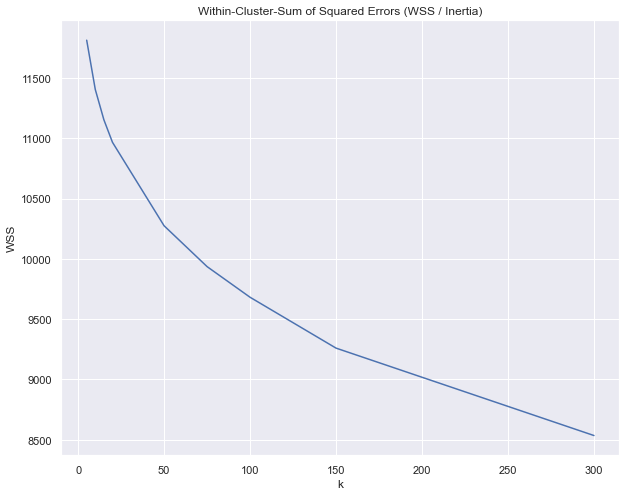

In [22]:
plt.plot(result[:,0], result[:,1])
plt.xlabel('k')
plt.ylabel('WSS')
plt.title('Within-Cluster-Sum of Squared Errors (WSS / Inertia)')

**Silhoutte Score**

In [23]:
def simulate(k, vectors, metric='cosine'):
    """ 
    metric: cosine, euclidean, l1, l2, manhattan 
    """
    kmeans = KMeans(n_clusters=k, n_jobs=8, random_state=random_state)
    return silhouette_score(vectors, kmeans.fit_predict(vectors), metric=metric)

In [24]:
result = []
for k in k_candidates:
    dist = simulate(k, vectors)
    result.append([k, dist])
    print(k, dist)
    
result = np.array(result)

5 0.039033968
10 0.0011197308
15 0.0010488271
20 -0.004946288
50 -0.026564948
75 -0.031722363
100 -0.037232812
150 -0.030930722
300 -0.029745543


Text(0.5, 0, 'k')

Text(0, 0.5, 'silhoutte score')

Text(0.5, 1.0, 'silhoutte score')

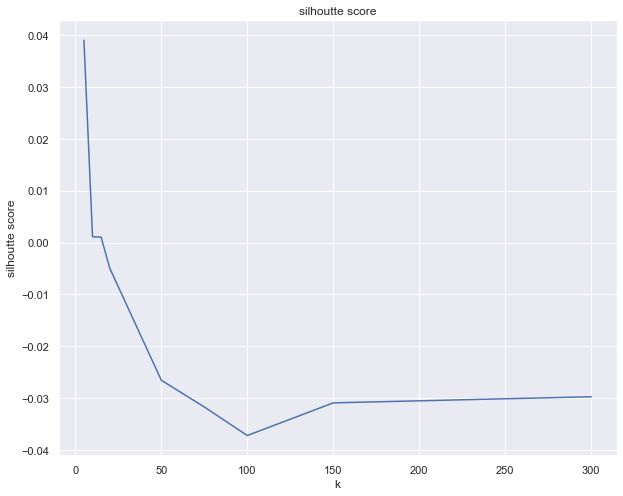

In [25]:
plt.plot(result[:,0], result[:,1])
plt.xlabel('k')
plt.ylabel('silhoutte score')
plt.title('silhoutte score')

For n_clusters = 5 The average silhouette_score is : 0.016559389038572844
For n_clusters = 10 The average silhouette_score is : -0.009613365642784854
For n_clusters = 15 The average silhouette_score is : -0.013011996138143068
For n_clusters = 20 The average silhouette_score is : -0.015177846652933232
For n_clusters = 50 The average silhouette_score is : -0.028890010391387597
For n_clusters = 75 The average silhouette_score is : -0.03794767574386734
For n_clusters = 100 The average silhouette_score is : -0.03265847314312924
For n_clusters = 150 The average silhouette_score is : -0.026704682517899373
For n_clusters = 300 The average silhouette_score is : -0.021944211295268544


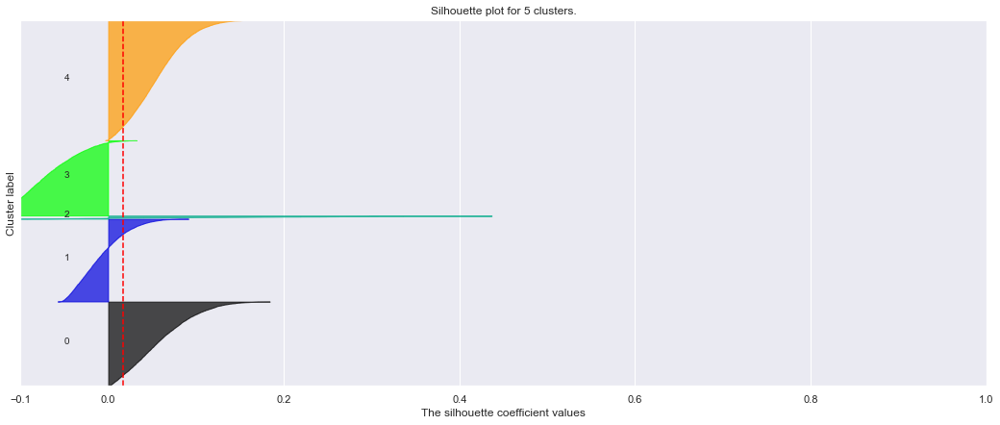

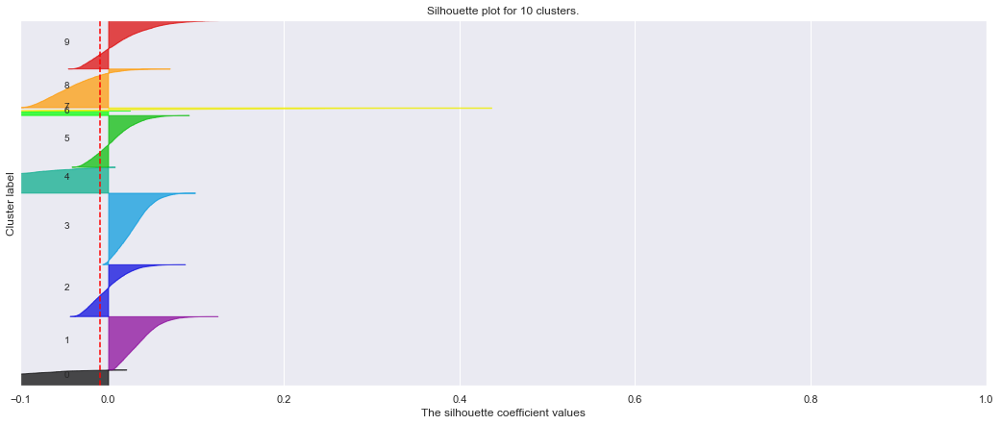

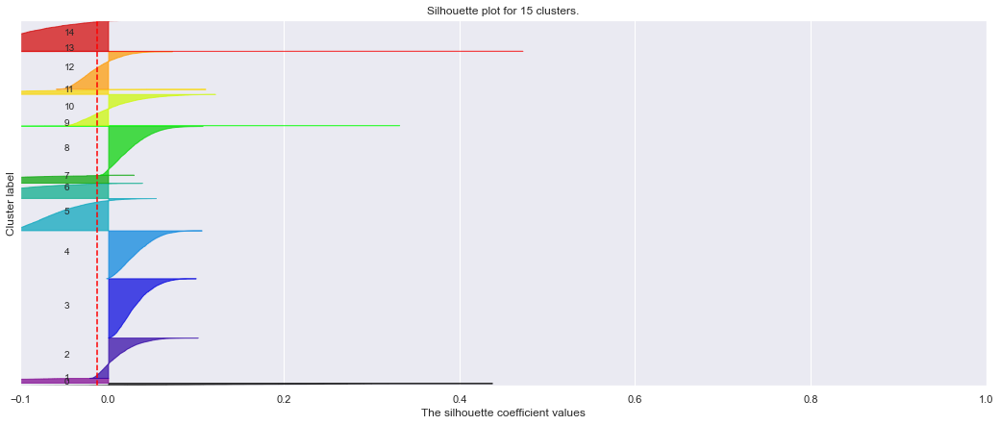

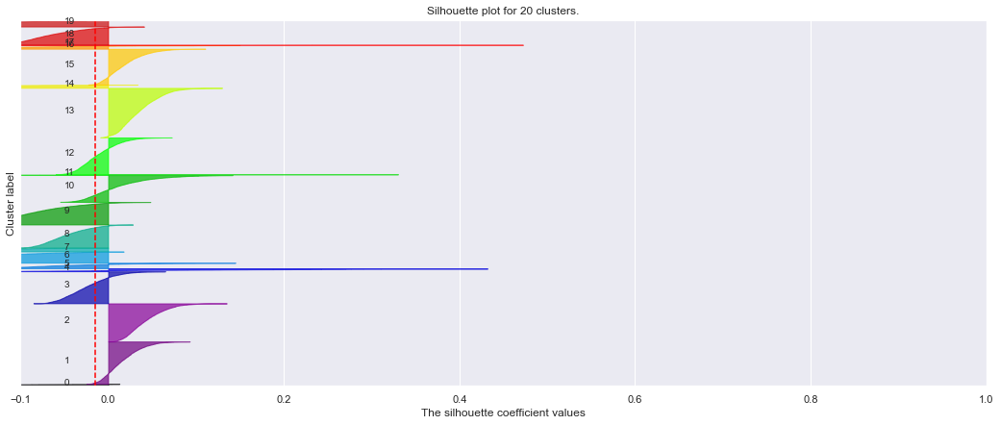

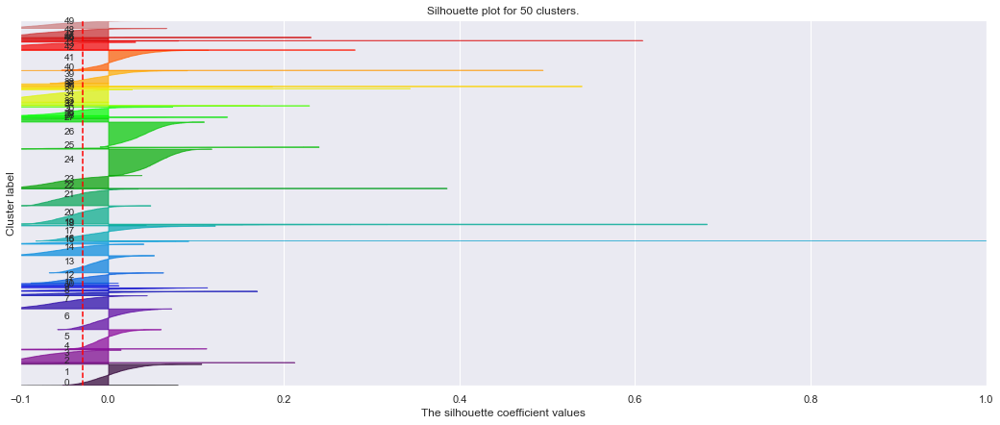

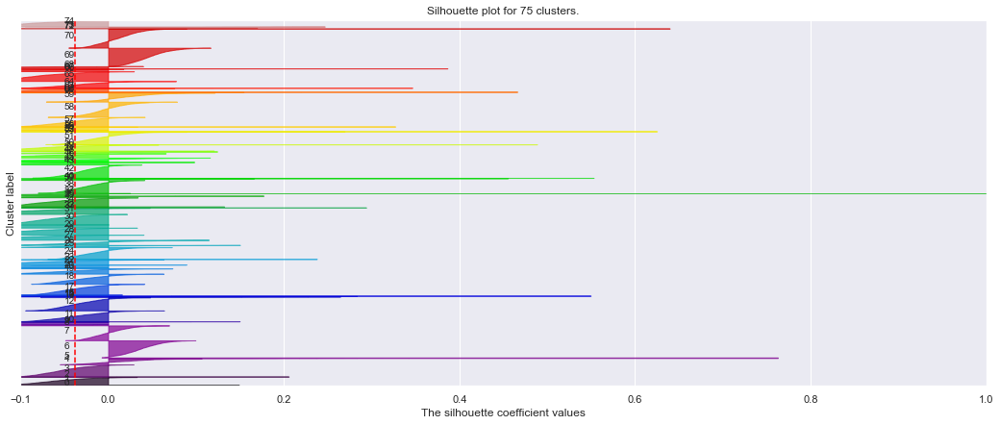

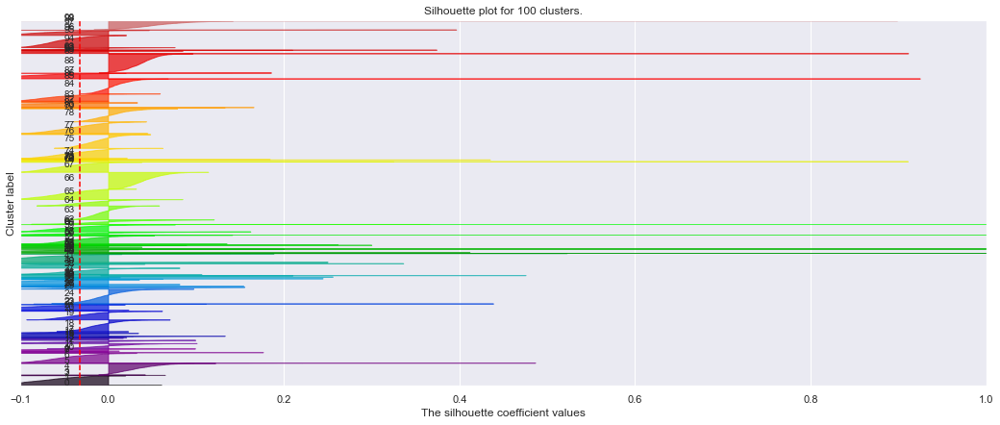

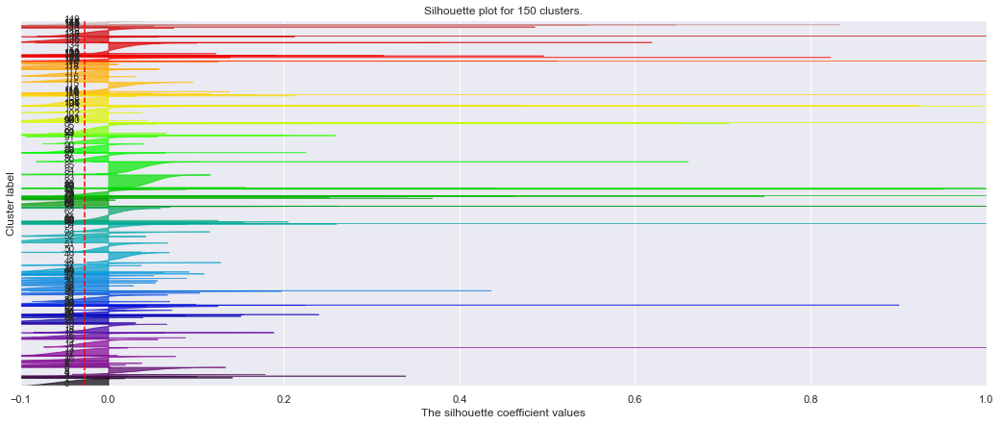

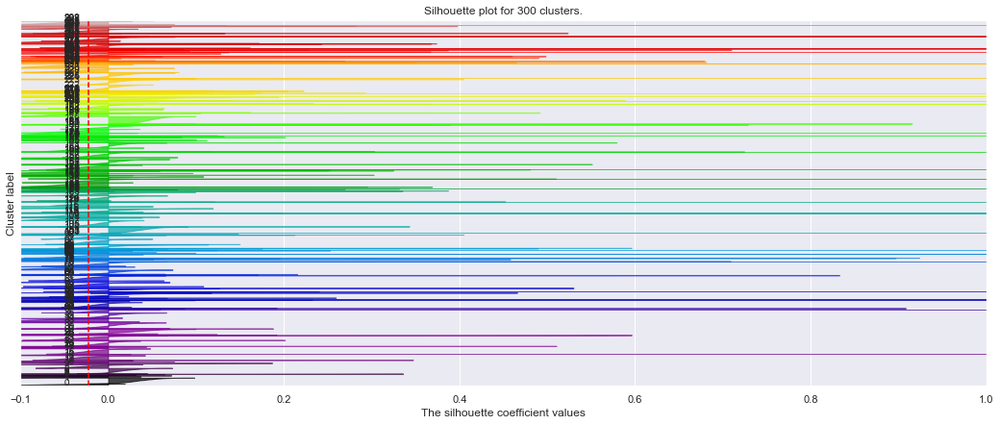

In [9]:
%matplotlib inline

for n_clusters in k_candidates:
    # Create a subplot with 1 row and 2 columns
    fig, ax1 = plt.subplots(figsize=(12, 14))
    fig.set_size_inches(18, 7)

    # The silhouette coefficient can range from -1, 1
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(vectors) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    clusterer = KMeans(n_clusters=n_clusters, random_state=random_state)
    cluster_labels = clusterer.fit_predict(vectors)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(vectors, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(vectors, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title(f"Silhouette plot for {n_clusters} clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

plt.show()

In [9]:
OPTIMUM_K = 5

## KMeans Clustering

In [4]:
remove = pd.read_csv('data/tmp/remove_words.csv')

In [5]:
remove = set(remove['term'])

In [12]:
kmeans = KMeans(n_clusters=OPTIMUM_K, n_jobs=8, random_state=random_state)
y = kmeans.fit_predict(vectors)
df['cluster'] = y

# start cluster from 1
df['cluster'] = df['cluster'].astype(int) + 1
df['cluster'] = df['cluster'].astype(str)

In [13]:
silhouette_score(vectors, y)
kmeans.inertia_

0.016559389038572844

11812.985725872177

In [14]:
def load_vectors(fname):
    fin = io.open(fname, 'r', encoding='utf-8', newline='\n', errors='ignore')
    n, d = map(int, fin.readline().split())
    data = {}
    for line in fin:
        tokens = line.rstrip().split(' ')
        data[tokens[0]] = np.array(list(map(float, tokens[1:])))
    return data

fasttext_vec = load_vectors(fname='data/nlp/wiki-news-300d-1M.vec')

In [15]:
clusters = {}

for k, centroid in enumerate(kmeans.cluster_centers_, 1):
    h = []
    print(k)
    for idx, (word, rep) in enumerate(fasttext_vec.items()):
        if idx % 100000 == 0 and idx != 0:
            print(idx, h)
        
        if word not in remove:
            # dist = np.linalg.norm(centroid - rep.reshape((-1, 1)))
            dist = spatial.distance.cosine(centroid, rep.reshape((-1, 1)))

            heappush(h, (-dist, word))

            if len(h) > 10:
                _ = heappop(h)

    clusters[k] = [item[1] for item in h]
    print(", ".join(clusters[k]))

1
100000 [(-0.3449554586503595, 'things'), (-0.3433953963602927, 'stuff'), (-0.3407367509198814, 'everything'), (-0.33166834569457926, 'something'), (-0.34191021232783003, 'brown'), (-0.32503465726122893, 'wooden'), (-0.3194495955528789, 'one'), (-0.3281405648911374, 'thing'), (-0.32660881370904327, 'kind'), (-0.3405804121141567, 'clothes')]
200000 [(-0.3449554586503595, 'things'), (-0.3433953963602927, 'stuff'), (-0.3407367509198814, 'everything'), (-0.33166834569457926, 'something'), (-0.34191021232783003, 'brown'), (-0.32503465726122893, 'wooden'), (-0.3194495955528789, 'one'), (-0.3281405648911374, 'thing'), (-0.32660881370904327, 'kind'), (-0.3405804121141567, 'clothes')]
300000 [(-0.3449554586503595, 'things'), (-0.3433953963602927, 'stuff'), (-0.3407367509198814, 'everything'), (-0.33166834569457926, 'something'), (-0.34191021232783003, 'brown'), (-0.32503465726122893, 'wooden'), (-0.3194495955528789, 'one'), (-0.3281405648911374, 'thing'), (-0.32660881370904327, 'kind'), (-0.34

700000 [(-0.3508342953103416, 'artist'), (-0.34644768874802156, 'expeditions'), (-0.33632268098143614, 'musician'), (-0.29707350037375024, 'adventurers'), (-0.33290485700768424, 'adventuring'), (-0.1802285115530562, 'adventurer'), (-0.3356214845035096, 'journey'), (-0.25537523737755297, 'adventure'), (-0.28986266902303004, 'adventures'), (-0.23151480831951832, 'solo')]
800000 [(-0.3508342953103416, 'artist'), (-0.34644768874802156, 'expeditions'), (-0.33632268098143614, 'musician'), (-0.29707350037375024, 'adventurers'), (-0.33290485700768424, 'adventuring'), (-0.1802285115530562, 'adventurer'), (-0.3356214845035096, 'journey'), (-0.25537523737755297, 'adventure'), (-0.28986266902303004, 'adventures'), (-0.23151480831951832, 'solo')]
900000 [(-0.3508342953103416, 'artist'), (-0.34644768874802156, 'expeditions'), (-0.33632268098143614, 'musician'), (-0.29707350037375024, 'adventurers'), (-0.33290485700768424, 'adventuring'), (-0.1802285115530562, 'adventurer'), (-0.3356214845035096, 'jo

In [16]:
for k, rep in clusters.items():
    print(f'k={k}: {sorted(rep)}')

k=1: ['brown', 'clothes', 'everything', 'kind', 'one', 'something', 'stuff', 'thing', 'things', 'wooden']
k=2: ['a', 'charming', 'classic', 'everything', 'kind', 'one', 'something', 'stylish', 'too', 'truly']
k=3: ['adventure', 'adventurer', 'adventurers', 'adventures', 'adventuring', 'artist', 'expeditions', 'journey', 'musician', 'solo']
k=4: ['boat', 'downtown', 'hotel', 'kind', 'one', 'school', 'shops', 'something', 'thing', 'town']
k=5: ['either', 'go', 'just', 'kind', 'one', 'say', 'something', 'thing', 'too', 'way']


In [17]:
# Only words unique to each cluster
keywords = Counter(np.hstack(list(clusters.values())))

for k, rep in clusters.items():
    print(f'k={k}:', [word for word in rep if keywords[word] == 1])

k=1: ['things', 'stuff', 'brown', 'wooden', 'clothes']
k=2: ['truly', 'classic', 'a', 'stylish', 'charming']
k=3: ['artist', 'expeditions', 'musician', 'adventurers', 'adventuring', 'adventurer', 'journey', 'adventure', 'adventures', 'solo']
k=4: ['shops', 'hotel', 'boat', 'downtown', 'school', 'town']
k=5: ['either', 'say', 'way', 'go', 'just']


In [92]:
df['cluster'] = df['cluster'].astype(str)

In [93]:
px.scatter_mapbox(df, lat='latitude', lon='longitude', color='cluster')

In [23]:
# top 10 word frequency in each cluster
for k in sorted(df['cluster'].unique()):
    print(k)
    ct = len(df[df['cluster'] == k])
    df.loc[df['cluster'] == k, 'description_cleaned'].str.split(' ').explode().value_counts()[:10] / ct

1


chair       0.15
tea         0.13
kettle      0.12
washer      0.12
toaster     0.12
mattress    0.11
stove       0.10
upstairs    0.10
cooking     0.09
breakfast   0.09
Name: description_cleaned, dtype: float64

2


stylish        0.14
luxury         0.11
beautifully    0.09
entertaining   0.09
vibrant        0.09
gorgeous       0.08
comfort        0.08
designer       0.08
interior       0.08
iconic         0.07
Name: description_cleaned, dtype: float64

3


solo         0.97
adventurer   0.96
ambiance     0.12
outdoors     0.09
cosiness     0.08
traveler     0.06
pet          0.04
airport      0.04
friend       0.04
group        0.04
Name: description_cleaned, dtype: float64

4


km         0.17
airport    0.12
darling    0.11
junction   0.09
m          0.09
market     0.09
pub        0.09
village    0.08
ride       0.08
solo       0.07
Name: description_cleaned, dtype: float64

5


check      0.14
key        0.10
question   0.10
leave      0.09
hide       0.09
take       0.09
go         0.09
host       0.09
contact    0.08
rent       0.08
Name: description_cleaned, dtype: float64

In [24]:
np.savetxt('data/tmp/word_embeddings.csv', vectors)
df.to_csv('data/tmp/listings_clusters.csv', index=False)

# Topic Modelling & LDA

In [15]:
vectors.shape

(35154, 300)

In [2]:
vectors = np.loadtxt('data/tmp/word_embeddings.csv')
df = pd.read_csv('data/tmp/listings_clusters.csv')

/Users/Kai/anaconda3/envs/dev/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning:

Columns (44,62,63,88) have mixed types. Specify dtype option on import or set low_memory=False.



In [17]:
id2word = corpora.Dictionary(df['description_cleaned'].str.split(' ').values)

In [18]:
corpus = [id2word.doc2bow(text) for text in df['description_cleaned'].str.split(' ').values]

In [19]:
# Human readable format of corpus (term-frequency)
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[('alternative', 1),
  ('appreciate', 1),
  ('bathrobe', 1),
  ('casual', 1),
  ('ceo', 1),
  ('confirm', 1),
  ('end', 2),
  ('expensive', 1),
  ('fluffy', 1),
  ('friend', 1),
  ('get', 1),
  ('hello', 1),
  ('hint', 2),
  ('host', 3),
  ('hotel', 2),
  ('hotelier', 1),
  ('key', 1),
  ('know', 1),
  ('list', 1),
  ('listing', 1),
  ('message', 2),
  ('positively', 1),
  ('pretty', 1),
  ('read', 2),
  ('relaxed', 1),
  ('request', 2),
  ('reservation', 2),
  ('review', 2),
  ('shareholder', 1),
  ('smooth', 1),
  ('speed', 1),
  ('talk', 1),
  ('thing', 2),
  ('treat', 2),
  ('way', 2)]]

In [20]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
        dictionary : Gensim dictionary
        corpus : Gensim corpus
        texts : List of input texts
        limit : Max num of topics

    Returns:
        model_list : List of LDA topic models
        coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    
    for num_topics in range(start, limit, step):
        
        model = LdaModel(corpus=corpus, id2word=id2word, num_topics=num_topics, random_state=random_state)
        model_list.append(model)
        
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [21]:
start = 8
limit = 41
step = 4
model_list, coherence_values = compute_coherence_values(dictionary=id2word, 
                                                        corpus=corpus, 
                                                        texts=df['description_cleaned'].str.split(' ').values, 
                                                        start=start, 
                                                        limit=limit, 
                                                        step=step)

Coherence scores
8 : 0.4635587634614834
12 : 0.4679194156831373
16 : 0.45661002091327085
20 : 0.43755550179771807
24 : 0.4537147688354513
28 : 0.43109272515208324
32 : 0.44978499745786416
36 : 0.42361732759100645
40 : 0.3966709423014122


Text(0.5, 0, 'Num Topics')

Text(0, 0.5, 'Coherence score')

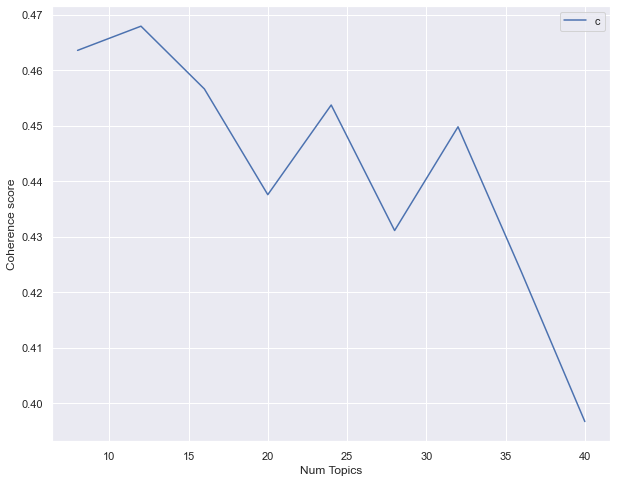

In [22]:
print('Coherence scores')
n_topics = iter(range(start, limit, step))
for score in coherence_values:
    print(next(n_topics), ':', score)
    
plt.plot(range(start, limit, step), coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [23]:
# Select the model
idx = coherence_values.index(max(coherence_values))
optimal_model = model_list[idx]
print('Optimal n topics:', optimal_model.num_topics)
print('Maximum coherence value:', max(coherence_values))

# Compute Perplexity - a measure of how good the model is. lower the better.
print('Perplexity: ', optimal_model.log_perplexity(corpus))

# print the topics
model_topics = optimal_model.show_topics(formatted=False)
pprint(optimal_model.print_topics(num_words=10))

Optimal n topics: 12
Maximum coherence value: 0.4679194156831373
Perplexity:  -8.291587775956131
[(0,
  '0.015*"kettle" + 0.013*"toaster" + 0.013*"unlimited" + 0.012*"chair" + '
  '0.012*"utensil" + 0.012*"shampoo" + 0.011*"wi" + 0.011*"fi" + 0.010*"tea" + '
  '0.010*"iron"'),
 (1,
  '0.033*"km" + 0.025*"airport" + 0.018*"sauna" + 0.016*"complex" + '
  '0.015*"townhouse" + 0.013*"court" + 0.013*"spa" + 0.012*"m" + '
  '0.011*"tennis" + 0.009*"de"'),
 (2,
  '0.019*"luxury" + 0.012*"stylish" + 0.011*"designer" + 0.010*"contemporary" '
  '+ 0.010*"position" + 0.010*"luxurious" + 0.010*"lifestyle" + '
  '0.009*"security" + 0.008*"finish" + 0.008*"suite"'),
 (3,
  '0.037*"darling" + 0.025*"point" + 0.015*"bay" + 0.014*"market" + '
  '0.013*"eastern" + 0.012*"fish" + 0.011*"star" + 0.010*"opera" + '
  '0.009*"rail" + 0.009*"casino"'),
 (4,
  '0.016*"child" + 0.014*"cot" + 0.012*"tea" + 0.012*"baby" + '
  '0.011*"breakfast" + 0.010*"request" + 0.010*"extra" + 0.010*"adult" + '
  '0.008*"entra

In [12]:
# visualize modelled topics and export graph
vis = pyLDAvis.gensim.prepare(optimal_model, corpus, id2word)
pyLDAvis.save_html(vis, 'data/topics.html')

In [14]:
vis

PreparedData(topic_coordinates=          x     y  topics  cluster  Freq
topic                                   
10     0.13  0.03       1        1 11.85
2      0.26  0.04       2        1 11.01
9     -0.02  0.07       3        1 10.66
0      0.03 -0.24       4        1 10.51
8     -0.14 -0.06       5        1  9.14
11    -0.02  0.19       6        1  7.55
4      0.00 -0.12       7        1  7.50
5     -0.16  0.07       8        1  7.43
7     -0.09 -0.00       9        1  6.96
3      0.00  0.05      10        1  6.79
1     -0.03 -0.03      11        1  5.75
6      0.05  0.02      12        1  4.87, topic_info=          Term    Freq   Total Category  logprob  loglift
1181   darling 2593.00 2593.00  Default    30.00    30.00
88        hide 2320.00 2320.00  Default    29.00    29.00
296         km 2229.00 2229.00  Default    28.00    28.00
104    airport 2278.00 2278.00  Default    27.00    27.00
183      point 1922.00 1922.00  Default    26.00    26.00
...        ...     ...     ...      ...      ...      ...
116     corner  223.84 1438.16  Topic12    -5.14     1.16
233   gorgeous  217.71 1317.32  Topic12    -5.17     1.22
195     washer  206.98 1694.37  Topic12    -5.22     0.92
277   recently  176.87 1370.43  Topic12    -5.38     0.97
251        fan  172.99 1419.67  Topic12    -5.40     0.92

[914 rows x 6 columns], token_table=      Topic  Freq         Term
term                          
4102      5  0.98          abc
3442      9  0.99       accent
3916     12  0.98    acclaimed
401       1  0.04  accommodate
401       2  0.10  accommodate
...     ...   ...          ...
943       4  0.01          zoo
943       5  0.01          zoo
943       6  0.01          zoo
943       8  0.05          zoo
943      10  0.92          zoo

[4412 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[11, 3, 10, 1, 9, 12, 5, 6, 8, 4, 2, 7])

Get dominant topic for each listing description

In [24]:
def format_topics_sentences(ldamodel, corpus, texts):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
                
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_dominant_topic = format_topics_sentences(ldamodel=optimal_model, 
                                            corpus=corpus, 
                                            texts=df['description'].values)

df_dominant_topic.reset_index(inplace=True)
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
# start topic from 1
df_dominant_topic['Dominant_Topic'] = df_dominant_topic['Dominant_Topic'].astype(int) + 1
df_dominant_topic.head()

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,6,0.46,"hide, junction, number, rent, go, bondi, curl,...",Come stay with Vinh & Stuart (Awarded as one o...
1,1,12,0.47,"x, surf, course, coastal, golf, solo, bike, ri...","Beautifully renovated, spacious and quiet, our..."
2,2,3,0.47,"luxury, stylish, designer, contemporary, posit...",Penthouse living in a great central location: ...
3,3,9,0.55,"check, key, contact, party, long, term, suitab...",Hi! We are a married professional couple with ...
4,4,8,0.43,"store, coogee, university, grocery, major, hos...","Double bed in decent sized bedroom, in two bed..."


In [25]:
df['dominant_topic'] = df_dominant_topic['Dominant_Topic']

In [26]:
df['dominant_topic'] = df['dominant_topic'].astype(str)

In [27]:
# Group top 5 sentences under each topic
sent_topics_sorteddf = pd.DataFrame()

sent_topics_outdf_grpd = df_dominant_topic.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf = pd.concat([sent_topics_sorteddf, 
                                             grp.sort_values(['Topic_Perc_Contrib'], ascending=[0]).head(1)], 
                                            axis=0)

Most representative document by topic

- `Topic_Perc_Contrib`: % of listing description that falls under the given topic
- `Keywords`: keywords of the topic
- `Text`: The listing description that best represents the given topic

In [28]:
sent_topics_sorteddf.drop('Document_No', 1, inplace=True)
sent_topics_sorteddf.reset_index(drop=True, inplace=True)
sent_topics_sorteddf.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Text"]
sent_topics_sorteddf

,Topic_Num,Topic_Perc_Contrib,Keywords,Text
0,1,0.96,"kettle, toaster, unlimited, chair, utensil, sh...","Our Newly built, Modern & Spacious Studio apar..."
1,2,0.96,"km, airport, sauna, complex, townhouse, court,...",Located in Padstow grannyflat boutique guest h...
2,3,0.98,"luxury, stylish, designer, contemporary, posit...",Magnificent sunny spacious duplex 3 bedroom pe...
3,4,0.97,"darling, point, bay, market, eastern, fish, st...",Enjoy daily 5 minute strolls to magnificent be...
4,5,0.97,"child, cot, tea, baby, breakfast, request, ext...","A charming backyard cabin.Sleeps 2 adults, 1 c..."
5,6,0.97,"hide, junction, number, rent, go, bondi, curl,...","2 minutes’ walk to the bay, 2 minutes’ walk to..."
6,7,0.93,"communal, super, storage, couch, hills, awesom...","Cute, characteristic 2 double bed apartment lo..."
7,8,0.97,"store, coogee, university, grocery, major, hos...",Thank you for looking at my listing! You proba...
8,9,0.96,"check, key, contact, party, long, term, suitab...",Beautiful spacious studio apartment minutes aw...
9,10,0.97,"experience, question, market, inner, world, fo...","In the very heart of vibrant, fashionable Surr..."


In [17]:
# does not seem to translate to any geographical pattern / trend
px.scatter_mapbox(df[df['dominant_topic'].isin(['1', '2', '12'])], lat='latitude', lon='longitude', color='dominant_topic', height=800)

In [30]:
df.to_csv('data/tmp/listings_clusters.csv', index=False)